<a href="https://colab.research.google.com/github/mastersigat/GeoPandas/blob/main/Seance2_Manipulation_donnees_spatiales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Séance 2 / Manipulation et représentation de données spatiales avec GeoPandas

GeoPandas est une librairie open source pour faciliter le travail avec des données géospatiales en python. GeoPandas étend les types de données utilisés par les pandas pour permettre des opérations spatiales sur des types géométriques. Les opérations géométriques sont effectuées par shapely. Geopandas dépend en outre de fiona pour l'accès aux fichiers et de matplotlib pour le traçage. 

https://geopandas.org/en/stable/index.html

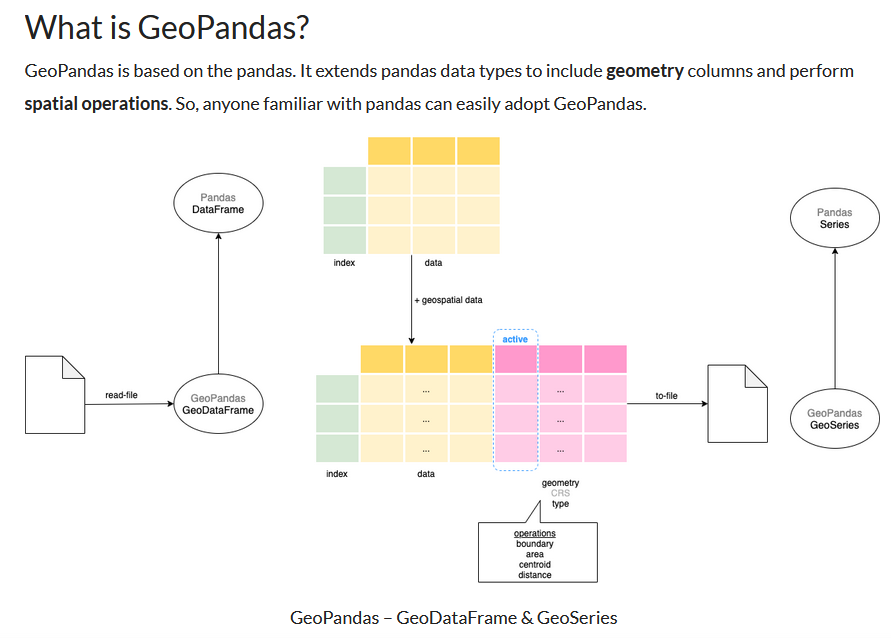

##Configuration de l'environnement de travail

In [ ]:
#Initialisation de l'environnement avec geopandas
!apt update
!apt install gdal-bin python-gdal python3-gdal 
# Install rtree - Geopandas requirment
!apt install python3-rtree 
# Install Geopandas
! pip install geopandas
# Instal MatplotLib
! pip install matplotlib
# Instal contextily
!pip install contextily
#Depuis sa version 0.8, Geopandas peut fonctionner de manière expérimental avec Pygeos ce qui accèlère certaines opérations
!pip install pygeos
# Pour la cartographie thématique
!pip install mapclassify
# Pour la cartographie interactive
!pip install folium

In [ ]:
#Importation des librairies nécessaires
import pandas as pd #Gestion de données
import matplotlib as plt #Visualisation de données
import geopandas as gpd #Gestion données spatiales
import contextily as ctx #Fonds de carte
import numpy as np #Manipulation de tableaux
import shapely #Manipulation de géométrie
import folium #Cartographie interactive
import mapclassify #Cartographie thématique

##Importer les données spatiales de la séance

In [ ]:
#Téléchargement des datas depuis le site opendata de Paris

!wget -O velib.geojson https://opendata.paris.fr/explore/dataset/velib-disponibilite-en-temps-reel/download/?format=geojson&timezone=Europe/Berlin&lang=fr
!wget -O IRIS.geojson https://data.iledefrance.fr/explore/dataset/iris/download/?format=geojson&refine.dep=75&timezone=Europe/Berlin&lang=fr 

### La couche IRIS

https://geopandas.org/en/stable/docs/reference/api/geopandas.read_file.html

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((2.35215 48.85267, 2.35213 48.85257, ..."
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((2.37349 48.86666, 2.37335 48.86689, ..."
2,Picpus 23,75112,4623,H,751124623,Paris 12e Arrondissement,75,"POLYGON ((2.39777 48.84822, 2.39752 48.84824, ..."
3,Gare 11,75113,5011,H,751135011,Paris 13e Arrondissement,75,"POLYGON ((2.37039 48.82410, 2.36995 48.82480, ..."
4,Saint-Gervais 4,75104,1404,H,751041404,Paris 4e Arrondissement,75,"POLYGON ((2.36272 48.85462, 2.36258 48.85467, ..."


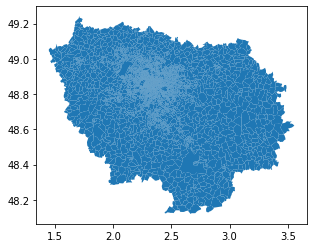

In [5]:
#Importer le couche des IRIS

IRIS= gpd.read_file("IRIS.geojson", encoding='utf-8')
IRIS.plot()
IRIS.head(5)

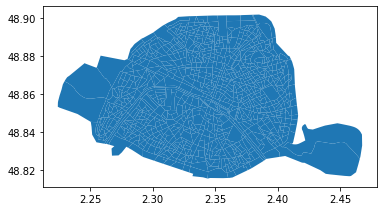

In [7]:
#Garder uniquement les IRIS de Paris

IRISPARIS = IRIS[(IRIS["dep"] == 75)]
IRISPARIS.plot()

In [8]:
#Checker les types des champs de la couche IRIS

IRISPARIS.dtypes

nom_iris       object
insee_com       int64
iris            int64
typ_iris       object
code_iris       int64
nom_com        object
dep             int64
geometry     geometry
dtype: object

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  This is separate from the ipykernel package so we can avoid doing imports until


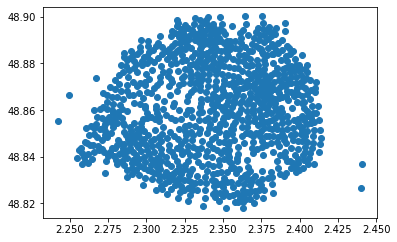

In [9]:
#Passer les polygones en centroides (à la volée)

IRISPARIS.centroid.plot()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  


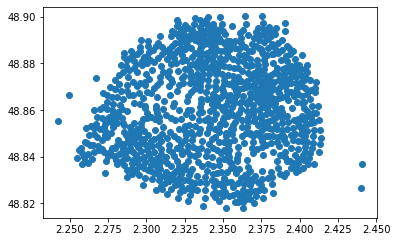

In [ ]:
#Passer les polygones en centroides (comme une couche)

IRISPARIScentro = IRISPARIS.copy()
IRISPARIScentro.geometry = IRISPARIScentro['geometry'].centroid
IRISPARIScentro.plot()

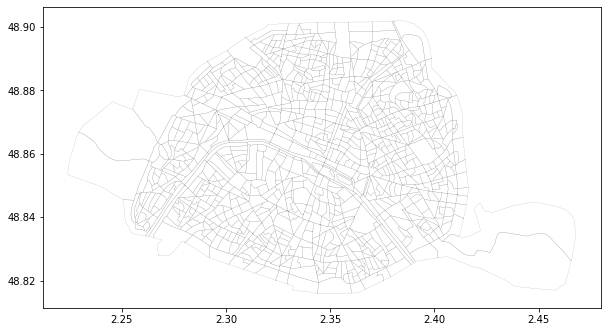

In [10]:
#Cartographier les IRIS en mode contours

IRISPARIS.boundary.plot(figsize=(10,10), linewidth=0.15, color = 'grey')

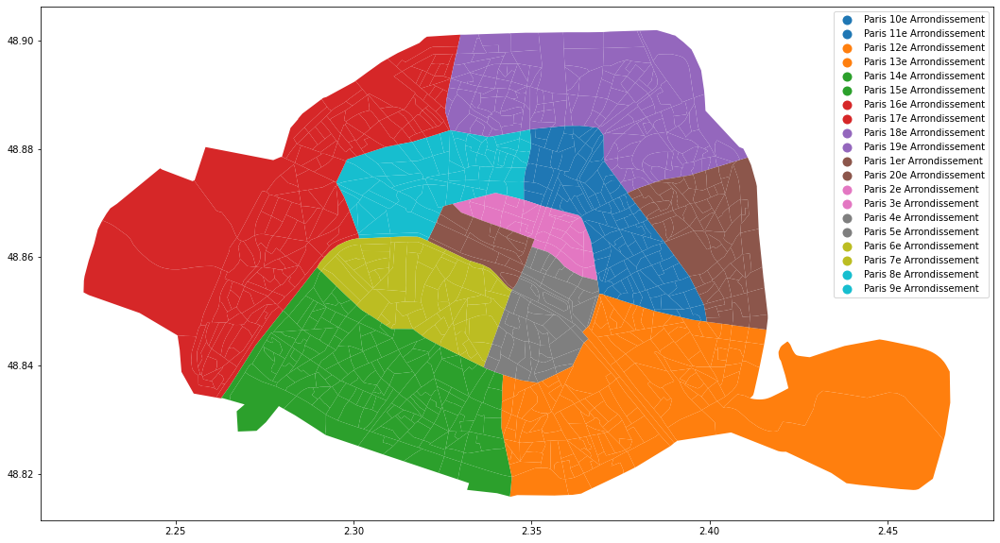

In [11]:
#Cartographier les IRIS en fonction de l'arrondissement

IRISPARIS.plot(column = "nom_com", linewidth=0.5, figsize=(20,10), legend=True)

In [13]:
# Faire une carte interactive avec la biliothèque Folium (https://python-visualization.github.io/folium/)

map = folium.Map(
    width='80%',height='50%',
    location=[48.863170000122665, 2.342566412818605],
    zoom_start=12,
    tiles="cartodbpositron")

IRIS = folium.GeoJson(IRISPARIS).add_to(map)

folium.GeoJsonTooltip(['nom_iris', 'nom_com']).add_to(IRIS)

map

In [14]:
# Exporter cette carte en HTML

map.save(outfile= "folium.html")

### La couche Vélibs

,name,stationcode,ebike,mechanical,duedate,numbikesavailable,numdocksavailable,capacity,is_renting,is_installed,nom_arrondissement_communes,is_returning,geometry
0,Toudouze - Clauzel,9020,1,0,2022-02-26T16:17:50+00:00,1,19,21,OUI,OUI,Paris,OUI,POINT (2.33736 48.87930)
1,Benjamin Godard - Victor Hugo,16107,2,2,2022-02-26T16:19:30+00:00,4,31,35,OUI,OUI,Paris,OUI,POINT (2.27572 48.86598)
2,Alibert - Jemmapes,10013,10,19,2022-02-26T16:19:46+00:00,29,30,60,OUI,OUI,Paris,OUI,POINT (2.36610 48.87104)
3,Charonne - Robert et Sonia Delauney,11104,3,1,2022-02-26T16:20:15+00:00,4,11,20,OUI,OUI,Paris,OUI,POINT (2.39257 48.85591)
4,Messine - Place Du Pérou,8026,0,1,2022-02-26T16:17:24+00:00,1,11,12,OUI,OUI,Paris,OUI,POINT (2.31551 48.87545)


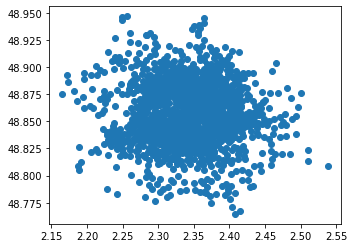

In [15]:
#Importer la couche des velibs

Velib= gpd.read_file("velib.geojson", encoding='utf-8')
Velib.plot()
Velib.head()

1002

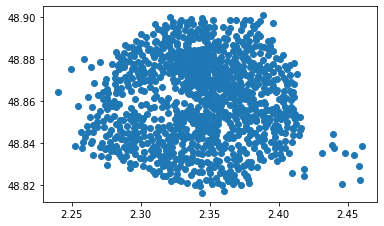

In [16]:
#Ne garder que les stations de Velibs de la ville de Paris (sélection par attribut)

VelibParis = Velib[(Velib["nom_arrondissement_communes"] == 'Paris')]
VelibParis.plot()
len(VelibParis)

###La couche des arrondissements (à importer via un fichier en local)

https://opendata.paris.fr/explore/dataset/arrondissements/export/?disjunctive.c_ar&disjunctive.c_arinsee&disjunctive.l_ar

,c_ar,l_aroff,surface,l_ar,n_sq_co,c_arinsee,n_sq_ar,perimetre,geometry
0,19,Buttes-Chaumont,6.792651e+06,19ème Ardt,750001537,75119,750000019,11253.182479,"POLYGON ((2.38943 48.90122, 2.39014 48.90108, ..."
1,16,Passy,1.637254e+07,16ème Ardt,750001537,75116,750000016,17416.109657,"POLYGON ((2.27427 48.87837, 2.27749 48.87796, ..."
2,3,Temple,1.170883e+06,3ème Ardt,750001537,75103,750000003,4519.263648,"POLYGON ((2.36383 48.86750, 2.36389 48.86747, ..."
3,10,Entrepôt,2.891739e+06,10ème Ardt,750001537,75110,750000010,6739.375055,"POLYGON ((2.36469 48.88437, 2.36485 48.88436, ..."
4,17,Batignolles-Monceau,5.668835e+06,17ème Ardt,750001537,75117,750000017,10775.579516,"POLYGON ((2.29517 48.87396, 2.29504 48.87378, ..."


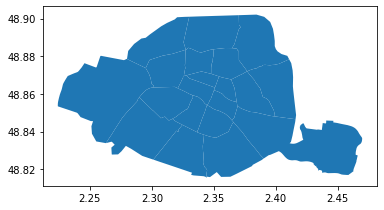

In [17]:
#Importer le jeu de données dans l'espace de travail puis le convertir en gdf

Ardt= gpd.read_file("arrondissements.geojson", encoding='utf-8')
Ardt.plot()
Ardt.head()

## Ecrire un jeu de données spatiales

https://geopandas.org/en/stable/docs/reference/api/geopandas.GeoDataFrame.to_file.html

In [ ]:
#Ecrire un geojson

VelibParis.to_file("Velibs.geojson", driver="GeoJSON")

#Ecrire un shapefile

VelibParis.to_file("Velibs.shp")

#Ecrire un gpk

IRISPARIS.to_file("Paris.gpkg", layer='IRIS', driver="GPKG")
VelibParis.to_file("Paris.gpkg", layer='VelibParis', driver="GPKG")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  import sys


## Calculer des statistique basiques (descriptives)

In [18]:
#Calculer des statistiques basiques pour tous les champs de la couche des vélibs

VelibParis.describe()

,ebike,mechanical,numbikesavailable,numdocksavailable,capacity
count,1002.000000,1002.00000,1002.000000,1002.000000,1002.000000
mean,3.857285,7.01497,10.872255,20.001996,32.136727
std,4.758356,10.33721,12.988877,13.729148,12.902395
min,0.000000,0.00000,0.000000,0.000000,0.000000
25%,1.000000,0.00000,2.000000,9.000000,23.000000
50%,2.000000,2.00000,5.000000,20.000000,30.000000
75%,5.000000,10.00000,16.000000,29.000000,39.000000
max,54.000000,68.00000,74.000000,67.000000,74.000000


In [19]:
# Calculer le nombre de stations de vélibs

VelibParis["ebike"].size

1002

In [20]:
# Calculer la somme totale des capacités

VelibParis["capacity"].sum()

32201

In [21]:
# Calculer la moyenne des capacités

VelibParis["capacity"].mean()

32.13672654690619

In [22]:
#Calculer le nombre total de station de vélibs, le nombre total de places de vélibs et le nombre moyen de vélibs par station
A=VelibParis['stationcode'].size
B=VelibParis['capacity'].sum()
C=VelibParis['capacity'].mean()

print(A,B,C)

1002 32201 32.13672654690619


In [ ]:
# Calculer le nombre de vélos disponibles et d'emplacement disponibles

## Cartographie thématique

Couleurs de ColorBrewer > https://www.datanovia.com/en/wp-content/uploads/dn-tutorials/ggplot2/figures/101-rcolorbrewer-palette-rcolorbrewer-palettes-1.png 


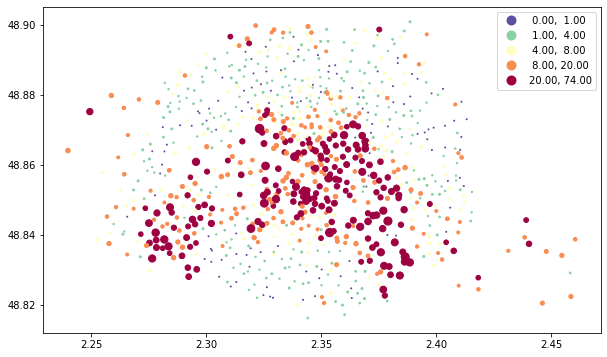

In [23]:
#Cartographier le nombre de vélibs disponibles par station

VelibParis.plot(figsize=(10,10),column="numbikesavailable", markersize="numbikesavailable",alpha=1, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)


#### Ajouter un fond de carte (Librairie Contextily)

https://contextily.readthedocs.io/en/latest/intro_guide.html

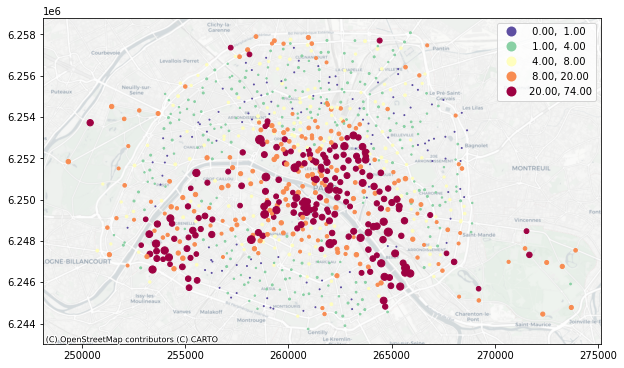

In [24]:
#Cartographier le nombre de vélibs disponibles par station avec un fond de carte

ax = VelibParis.to_crs('EPSG:3857').plot(figsize=(10,10),column="numbikesavailable", markersize="numbikesavailable",alpha=1, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)


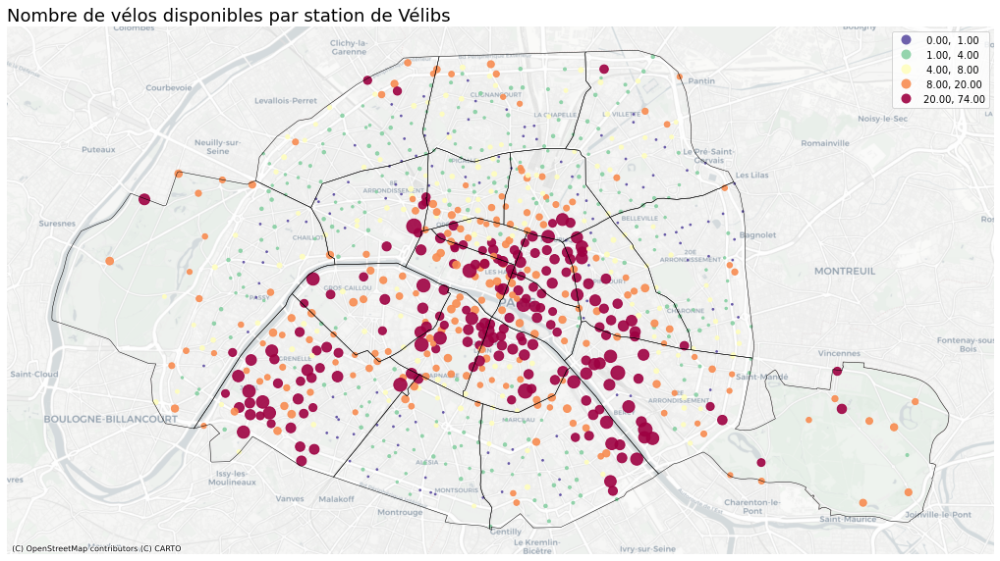

In [26]:
#Faire une carte avec deux couches

Carte1, ax = plt.pyplot.subplots(figsize=(18,18))
VelibParis.to_crs('EPSG:3857').plot(ax=ax,column="numbikesavailable", markersize=VelibParis['numbikesavailable']*3 ,alpha=0.9, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.pyplot.title('Nombre de vélos disponibles par station de Vélibs', loc='left', fontsize=18)
plt.pyplot.show()

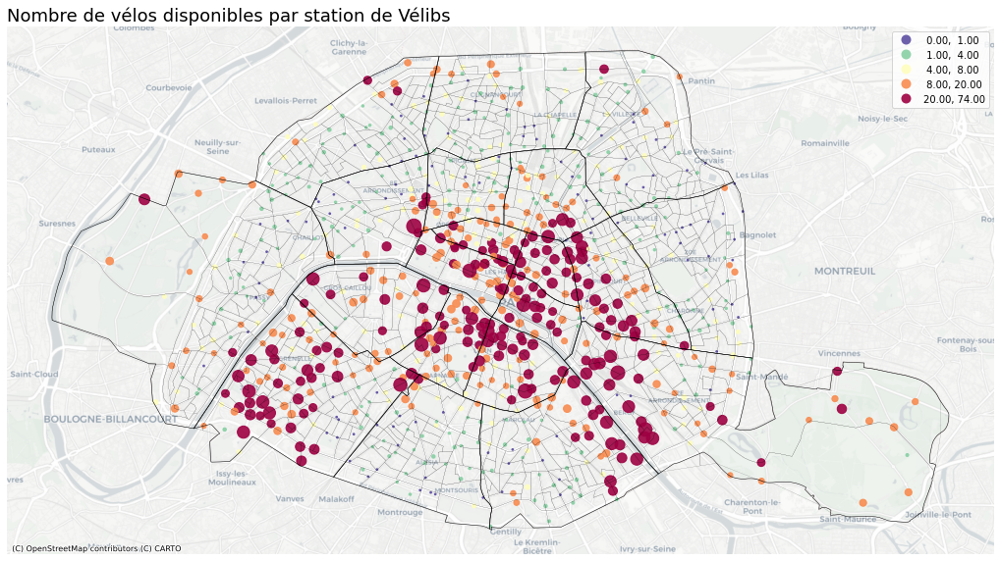

In [28]:
#Faire une carte avec trois couches

Carte1, ax = plt.pyplot.subplots(figsize=(18,18))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'black')
VelibParis.to_crs('EPSG:3857').plot(ax=ax,column="numbikesavailable", markersize=VelibParis['numbikesavailable']*3 ,alpha=0.9, cmap='Spectral_r',scheme='quantiles', categorical=False, legend=True)
ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.pyplot.title('Nombre de vélos disponibles par station de Vélibs', loc='left', fontsize=18)
plt.pyplot.show()

In [ ]:
# Enreigistrer une carte en image

Carte1.savefig("Carte1.png")

## Jointure attributaire, calcul d'indicateurs, cartographie thématique

In [29]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O population.csv https://opendata.arcgis.com/datasets/b2936d51b66b4213ae9351657fa230ac_0.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D


--2022-02-26 16:43:08--  https://opendata.arcgis.com/datasets/b2936d51b66b4213ae9351657fa230ac_0.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D
Resolving opendata.arcgis.com (opendata.arcgis.com)... 54.205.192.36, 34.206.0.62, 54.173.145.175
Connecting to opendata.arcgis.com (opendata.arcgis.com)|54.205.192.36|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/csv]
Saving to: ‘population.csv’

population.csv          [  <=>               ]   2.70M  7.42MB/s    in 0.4s    

2022-02-26 16:43:14 (7.42 MB/s) - ‘population.csv’ saved [2829414]



In [30]:
#Importer CSV to dataframe

population = pd.read_csv("population.csv", sep=',')
population.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,nb_pop,nb_pop_n5,nb_pop_1999,nb_evo_pop,nb_evo_pop_n5,pct_evo_pop,pct_evo_pop_n5,nb_surface,nb_densite,nb_p_age_0,nb_p_age_5,nb_p_age_10,nb_p_age_15,nb_p_age_20,nb_p_age_25,nb_p_age_30,nb_p_age_35,nb_p_age_40,nb_p_age_45,nb_p_age_50,nb_p_age_55,nb_p_age_60,nb_p_age_65,nb_p_age_70,nb_p_age_75,nb_p_age_80,nb_p_age_85,nb_p_age_90p,nb_age_019,nb_age_60p,nb_age_65p,nb_age_75p,pct_age_019,pct_age_60p,pct_age_65p,pct_age_75p,nb_age_019_n5,nb_age_60p_n5,nb_age_65p_n5,nb_age_75p_n5,pct_age_019_n5,pct_age_60p_n5,pct_age_65p_n5,pct_age_75p_n5,pct_evo_age_019,pct_evo_age_60p,pct_evo_age_65p,pct_evo_age_75p,nb_etranger,pct_etranger,nb_etranger_n5,pct_etranger_n5,pct_evo_etranger,nb_immigre,pct_immigre,nb_immigre_n5,pct_immigre_n5,pct_evo_immigre,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,3057.042017,3217.439540,NaN,-160.397523,NaN,NaN,NaN,13.970506,218.821133,148.955730,177.943931,146.812866,170.520801,156.797214,182.506170,275.305355,307.793894,202.457828,239.346085,184.705758,250.304868,227.499419,156.929230,76.833152,65.117371,54.575564,23.386995,9.249785,630.233327,624.591518,387.092098,147.329716,20.615789,20.431238,12.662309,4.819355,716.909029,546.782728,346.803817,87.006563,22.281974,16.994344,10.778876,2.704217,-1.666185,3.436894,1.883433,2.115138,877.450019,28.702583,914.105993,28.410977,0.291606,1060.159129,34.679246,1108.278961,34.445992,0.233254,140,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,2040.366599,1954.406412,NaN,85.960187,NaN,NaN,NaN,10.675040,191.134334,160.714192,182.856416,100.667936,121.644577,158.341601,139.423531,144.347829,125.967739,102.165017,121.059342,160.052721,130.756622,97.369087,91.586849,17.924442,34.417971,43.866281,47.489671,57.714775,565.883121,392.369076,293.999989,185.488698,27.734385,19.230322,14.409175,9.090950,578.114079,370.133917,273.963417,180.639345,29.580034,18.938431,14.017730,9.242671,-1.845649,0.291891,0.391445,-0.151721,477.167833,23.386377,387.138965,19.808519,3.577858,650.452747,31.879210,555.138345,28.404448,3.474762,140,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,1953.311022,2105.998990,NaN,-152.687968,NaN,NaN,NaN,20.958297,93.199893,148.740526,105.996704,116.677914,87.542312,119.686909,190.230945,224.099158,164.612076,156.925985,131.718425,159.914543,66.307111,62.594629,108.189668,42.898095,26.392791,21.081567,15.085933,4.615730,458.957457,281.858413,217.263784,67.176021,23.496384,14.429776,11.122846,3.439085,576.910592,232.489845,163.369773,98.073337,27.393678,11.039409,7.757353,4.656856,-3.897295,3.390367,3.365493,-1.217771,571.623150,29.264318,473.290871,22.473461,6.790857,617.079310,31.591452,542.698413,25.769168,5.822284,140,T8 Est Ensemble,2494.946453,209582.967651


In [31]:
# Ne garder que les colonne importantes

PopulationOK = population[["c_ir", "l_ir", "nb_pop"]]
PopulationOK.head()

,c_ir,l_ir,nb_pop
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [32]:
#Renommer les colonnes

PopulationOK = PopulationOK.rename(columns={'c_ir': 'Code_IRIS', 'l_ir':'Libelle', 'nb_pop': 'Population'})
PopulationOK.head()

,Code_IRIS,Libelle,Population
0,930480801,Bel Air Grands Pêchers 1,3057.042017
1,930480803,Bel Air Grands Pechers 3,2040.366599
2,930480901,Ramenas Fabien Lagrange 1,1953.311022
3,930480903,Ramenas Fabien Lagrange 3,2538.624479
4,930481002,Branly Boissiere 2,1750.317596


In [33]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(PopulationOK, left_on='code_iris', right_on='Code_IRIS')
IRISPARIS.head()

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((2.35215 48.85267, 2.35213 48.85257, ...",751041603,Notre-Dame 3,103.055834
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((2.37349 48.86666, 2.37335 48.86689, ...",751114109,Folie Mericourt 9,3088.766745
2,Picpus 23,75112,4623,H,751124623,Paris 12e Arrondissement,75,"POLYGON ((2.39777 48.84822, 2.39752 48.84824, ...",751124623,Picpus 23,2649.654920
3,Gare 11,75113,5011,H,751135011,Paris 13e Arrondissement,75,"POLYGON ((2.37039 48.82410, 2.36995 48.82480, ...",751135011,Gare 11,2866.235802
4,Saint-Gervais 4,75104,1404,H,751041404,Paris 4e Arrondissement,75,"POLYGON ((2.36272 48.85462, 2.36258 48.85467, ...",751041404,Saint-Gervais 4,1738.230984


In [34]:
# Reprojeter la couche IRIS pour le calcul de surface

IRIS2154 = IRISPARIS.to_crs(2154)
IRIS2154.crs

<Projected CRS: EPSG:2154>
Name: RGF93 / Lambert-93
Axis Info [cartesian]:
- X[east]: Easting (metre)
- Y[north]: Northing (metre)
Area of Use:
- name: France - onshore and offshore, mainland and Corsica.
- bounds: (-9.86, 41.15, 10.38, 51.56)
Coordinate Operation:
- name: Lambert-93
- method: Lambert Conic Conformal (2SP)
Datum: Reseau Geodesique Francais 1993
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

In [35]:
# Ajouter une colonne Surface à la couche des IRIS

IRIS2154["surface"] = IRIS2154['geometry'].area/1000000
IRIS2154.head(10) 

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,surface
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((652462.000 6861597.900, 652460.000 6...",751041603,Notre-Dame 3,103.055834,0.124342
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((654039.800 6863141.800, 654029.800 6...",751114109,Folie Mericourt 9,3088.766745,0.058028
2,Picpus 23,75112,4623,H,751124623,Paris 12e Arrondissement,75,"POLYGON ((655805.320 6861076.570, 655787.300 6...",751124623,Picpus 23,2649.654920,0.089213
3,Gare 11,75113,5011,H,751135011,Paris 13e Arrondissement,75,"POLYGON ((653774.900 6858411.000, 653742.900 6...",751135011,Gare 11,2866.235802,0.078251
4,Saint-Gervais 4,75104,1404,H,751041404,Paris 4e Arrondissement,75,"POLYGON ((653239.000 6861809.000, 653228.980 6...",751041404,Saint-Gervais 4,1738.230984,0.052590
5,Chaussee d'Antin 6,75109,3406,A,751093406,Paris 9e Arrondissement,75,"POLYGON ((651401.200 6863802.000, 651332.910 6...",751093406,Chaussee D'Antin 6,80.174982,0.033001
6,Folie Mericourt 11,75111,4111,H,751114111,Paris 11e Arrondissement,75,"POLYGON ((654334.900 6863422.100, 654281.900 6...",751114111,Folie Mericourt 11,1421.158995,0.029939
7,Saint-Ambroise 5,75111,4205,H,751114205,Paris 11e Arrondissement,75,"POLYGON ((654131.000 6862507.000, 654150.000 6...",751114205,Saint-Ambroise 5,1948.529701,0.050757
8,Roquette 11,75111,4311,H,751114311,Paris 11e Arrondissement,75,"POLYGON ((653770.000 6861644.000, 653792.330 6...",751114311,Roquette 11,1802.483994,0.055164
9,Quinze Vingts 9,75112,4809,H,751124809,Paris 12e Arrondissement,75,"POLYGON ((654450.000 6860894.000, 654424.100 6...",751124809,Quinze Vingts 9,2492.195649,0.065757


In [36]:
#Calculer la densité de population des IRIS

IRIS2154["Densite"] = IRIS2154["Population"] / IRIS2154["surface"]
IRIS2154.head()

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,surface,Densite
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((652462.000 6861597.900, 652460.000 6...",751041603,Notre-Dame 3,103.055834,0.124342,828.807412
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((654039.800 6863141.800, 654029.800 6...",751114109,Folie Mericourt 9,3088.766745,0.058028,53229.122490
2,Picpus 23,75112,4623,H,751124623,Paris 12e Arrondissement,75,"POLYGON ((655805.320 6861076.570, 655787.300 6...",751124623,Picpus 23,2649.654920,0.089213,29700.317305
3,Gare 11,75113,5011,H,751135011,Paris 13e Arrondissement,75,"POLYGON ((653774.900 6858411.000, 653742.900 6...",751135011,Gare 11,2866.235802,0.078251,36628.928789
4,Saint-Gervais 4,75104,1404,H,751041404,Paris 4e Arrondissement,75,"POLYGON ((653239.000 6861809.000, 653228.980 6...",751041404,Saint-Gervais 4,1738.230984,0.052590,33052.590046


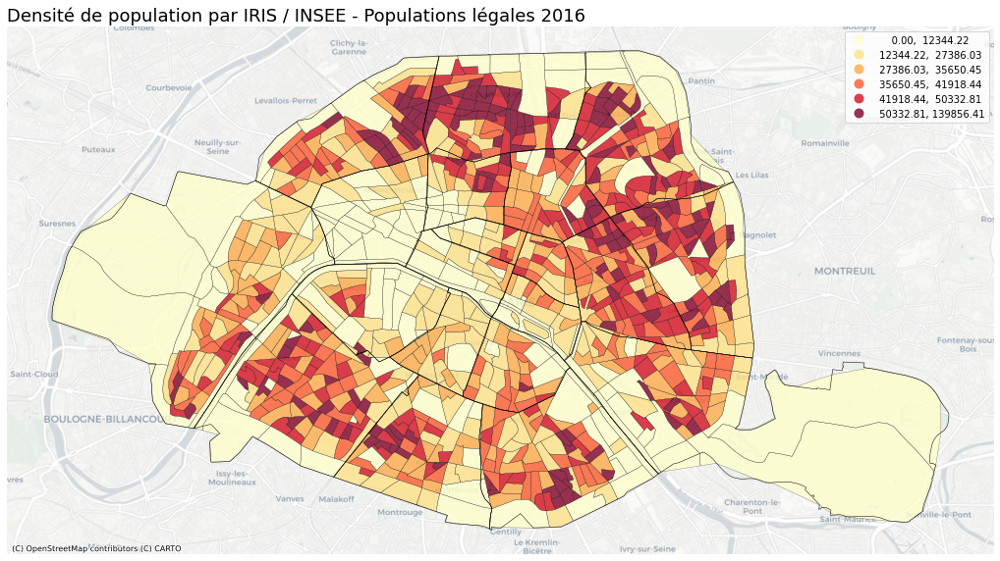

In [38]:
#Faire une carte des densité de population par IRIS

Carte2, ax = plt.pyplot.subplots(figsize=(18,18))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRIS2154.to_crs('EPSG:3857').plot(ax=ax, k=6, column='Densite', cmap='YlOrRd',scheme='quantiles', alpha= 0.8, legend=True)
ctx.add_basemap(ax,  source=ctx.providers.CartoDB.Positron)
ax.axis("off")
plt.pyplot.title('Densité de population par IRIS / INSEE - Populations légales 2016', loc='left', fontsize=18)
plt.pyplot.show()

In [43]:
# Faire une carte interactive avec la biliothèque Folium (https://python-visualization.github.io/folium/)

IRISfolium = pd.DataFrame(IRIS2154)

map = folium.Map(
    width='80%',height='50%',
    location=[48.863170000122665, 2.342566412818605],
    zoom_start=12,
    tiles="cartodbpositron")

folium.Choropleth(
    geo_data=IRIS2154,
    data=IRISfolium,
    name="choropleth",
    columns=["iris", "Densite"],
    key_on="feature.properties.iris",
    fill_color="YlOrRd",
    fill_opacity=0.9,
    line_opacity=0.2,
    legend_name="Densité de population (habitants/km2)",
).add_to(map)

map

AttributeError: ignored

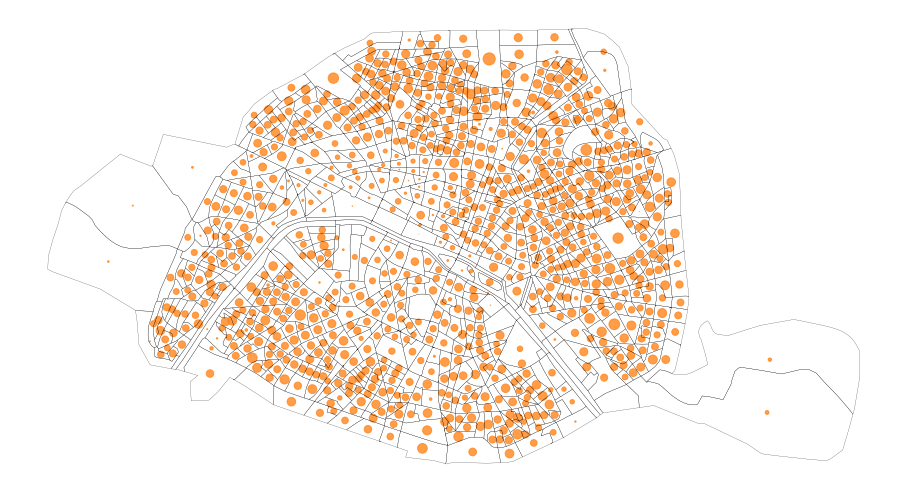

In [44]:
# Faire une carte des populations par IRIS

IRIScentro = IRIS2154.copy()
IRIScentro.geometry = IRIScentro['geometry'].centroid

Carte3, ax = plt.pyplot.subplots(figsize=(16,14))
IRISPARIS.boundary.to_crs('EPSG:2154').plot(ax=ax, linewidth=0.2, color = 'black')
IRIScentro.plot(ax=ax, color="#FF851B", markersize=IRIScentro['Population']/50, alpha=0.8, categorical=False, legend=True)
ax.axis("off")
plt.pyplottitle('Population par IRIS\nINSEE - population légale 2016', loc='left', fontsize=15)
plt.pyplotshow()

## Dissolve(With Stat)

,geometry,nom_iris,insee_com,iris,typ_iris,code_iris,dep,Code_IRIS,Libelle,Population
nom_com,,,,,,,,,,
Paris 10e Arrondissement,"POLYGON ((2.35411 48.86928, 2.35282 48.86955, ...",Porte Saint-Denis 2,75110,3802,H,751103802,75,751103802,Porte Saint-Denis 2,1739.949362
Paris 11e Arrondissement,"POLYGON ((2.37163 48.85278, 2.37059 48.85300, ...",Folie Mericourt 9,75111,4109,H,751114109,75,751114109,Folie Mericourt 9,3088.766745
Paris 12e Arrondissement,"POLYGON ((2.38978 48.82592, 2.38889 48.82660, ...",Picpus 23,75112,4623,H,751124623,75,751124623,Picpus 23,2649.654920
Paris 13e Arrondissement,"POLYGON ((2.35844 48.81601, 2.35747 48.81599, ...",Gare 11,75113,5011,H,751135011,75,751135011,Gare 11,2866.235802
Paris 14e Arrondissement,"POLYGON ((2.31802 48.82144, 2.31673 48.82172, ...",Montparnasse 11,75114,5311,A,751145311,75,751145311,Montparnasse 11,211.021485


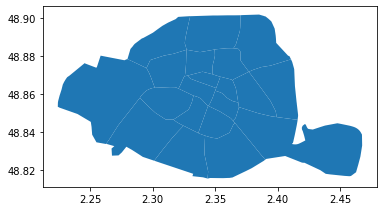

In [45]:
# Créer une couche des arrondissements

ARDTIRIS = IRISPARIS.dissolve(by='nom_com')
ARDTIRIS.plot()
ARDTIRIS.head()

In [46]:
# Créer une couche des arrondissements avec une agrégation statistiques (Population)

ARDTIRIS = IRIS2154.dissolve(by='insee_com', aggfunc='sum')
ARDTIRIS.head()


,geometry,iris,code_iris,dep,Code_IRIS,Population,surface,Densite
insee_com,,,,,,,,
75101,"POLYGON ((652081.290 6862048.180, 652038.370 6...",3644,12767173644,1275,12767173644,16545.0,1.827486,196419.344299
75102,"POLYGON ((651674.870 6863044.640, 651580.760 6...",9534,10514289534,1050,10514289534,20796.0,0.994136,328710.884634
75103,"POLYGON ((652508.700 6862567.660, 652413.950 6...",17745,12767527745,1275,12767527745,35049.0,1.171823,557159.554395
75104,"POLYGON ((653050.930 6861120.690, 652966.350 6...",30725,15771870725,1575,15771870725,27146.0,1.619944,359457.988367
75105,"POLYGON ((651897.060 6859945.570, 651801.780 6...",57514,23282607514,2325,23282607514,59333.0,2.516924,834564.296242


In [48]:
A= IRISPARIS["Population"].sum()
B= ARDTIRIS["Population"].sum()

print (A,B)

2206488.0 2206488.0



## Exercice avec les données de logement des IRIS

https://opendata.apur.org/datasets/recensement-iris-logement/data


* Produire une carte avec en cercle proportionnels le nombre de logement sociaux 
* Produire une carte avec en aplat de couleur le taux de logement vacant



In [ ]:
#Téléchargement des datas depuis l'opendata (https://opendata.apur.org/datasets/recensement-iris-population/geoservice)
!wget -O logement.csv https://opendata.arcgis.com/datasets/a57b54a5ae1046068a203d13d744343b_2.csv?outSR=%7B%22latestWkid%22%3A2154%2C%22wkid%22%3A102110%7D

In [52]:
#Importer CSV to dataframe

logement = pd.read_csv("logement.csv", sep=',')
logement.head(3)

,OBJECTID,n_sq_ir,c_cainsee,n_qu,c_ir,c_typeir,l_ir,m2_ip,m2_pop,m2_emp,nb_log,nb_rp,nb_rsecocc,nb_logvac,pct_rp,pct_rsecocc,pct_logvac,nb_log_n5,nb_rp_n5,nb_rsecocc_n5,nb_logvac_n5,pct_rp_n5,pct_rsecocc_n5,pct_logvac_n5,evo_nb_log,evo_pct_log,evo_pct_rp,evo_pct_rsecocc,evo_pct_logvac,nb_pieces_rp,nb_moy_perspiece,nb_prop,nb_loc_prive,nb_loc_social,nb_gratuit,pct_prop,pct_loc_prive,pct_loc_social,pct_gratuit,nb_pieces_rp_n5,...,pct_loc_social_n5,pct_gratuit_n5,evo_pct_prop,evo_pct_loc_prive,evo_pct_loc_social,evo_pct_gratuit,nb_rp_1p,nb_rp_2p,nb_rp_3p,nb_rp_4p,nb_rp_5pp,pct_rp_1p,pct_rp_2p,pct_rp_3p,pct_rp_4p,pct_rp_5pp,nb_rp_1p_n5,nb_rp_2p_n5,nb_rp_3p_n5,nb_rp_4p_n5,nb_rp_5pp_n5,pct_rp_1p_n5,pct_rp_2p_n5,pct_rp_3p_n5,pct_rp_4p_n5,pct_rp_5pp_n5,evo_pct_rp_1p,evo_pct_rp_2p,evo_pct_rp_3p,evo_pct_rp_4p,evo_pct_rp_5pp,nb_men_voit,pct_men_voit,nb_men_voit_n5,pct_men_voit_n5,evo_pct_men_voit,n_sq_epci,l_epci,shape_Length,shape_Area
0,1,930003891,93048,0.0,930480801,H,Bel Air Grands Pêchers 1,115523.688783,106227.518051,114780.364397,1215.000069,1152.805590,19.459808,42.734671,94.881113,1.601630,3.517257,1222.996726,1172.816794,7.993616,42.186316,95.896969,0.653609,3.449422,-7.996657,-0.653858,-1.015856,0.948021,0.067835,3345.776748,0.764260,560.050705,191.722344,382.744007,18.288533,48.581540,16.630935,33.201089,1.586437,3382.035273,...,39.662029,2.486245,7.263929,0.096819,-6.460940,-10.870567,139.458671,343.525777,332.156141,205.238045,132.426956,12.097328,29.799107,28.812850,17.803353,11.487362,122.702461,316.568701,435.219099,217.493086,80.833448,10.462202,26.992170,37.108873,18.544506,6.892249,1.635126,2.806938,-8.296024,-0.741154,4.595114,674.180839,58.481746,716.254373,61.071292,-2.589546,140.0,T8 Est Ensemble,1927.186327,139705.062882
1,2,930003875,93048,0.0,930480803,H,Bel Air Grands Pechers 3,88014.547679,80896.936435,81518.540816,827.500048,798.698213,1.017957,27.783878,96.519416,0.123016,3.357568,760.997964,729.426824,0.000000,31.571140,95.851350,0.000000,4.148650,66.502084,8.738799,0.668066,0.123016,-0.791082,2399.448585,0.818257,122.889304,124.417161,548.040149,3.351598,15.386200,15.577493,68.616674,0.419633,2296.487677,...,70.972545,1.037145,2.210358,0.763026,-2.355871,-4.213619,53.187556,227.772657,284.861463,143.500867,89.375669,6.659281,28.517988,35.665719,17.966845,11.190168,40.921335,136.541421,290.754600,207.632850,53.576617,5.610067,18.719002,39.860695,28.465206,7.345030,1.049214,9.798986,-4.194975,-10.498362,3.845138,437.745301,54.807347,374.788998,51.381302,3.426045,140.0,T8 Est Ensemble,1597.143066,106750.396820
2,3,930003874,93048,0.0,930480901,H,Ramenas Fabien Lagrange 1,158411.119470,138753.241185,149619.390800,1007.500054,912.101645,12.087402,83.311007,90.531176,1.199742,8.269082,942.497554,876.358827,12.591479,53.547248,92.982610,1.335969,5.681420,65.002500,6.896835,-2.451434,-0.136227,2.587662,2428.780086,0.791884,340.672556,421.808885,135.500873,14.119332,37.350284,46.245820,14.855896,1.548000,2535.264590,...,10.290437,2.671876,-1.938474,-1.503110,4.565460,-9.295885,163.441960,294.829000,264.661089,102.650929,86.518667,17.919270,32.324139,29.016622,11.254330,9.485639,198.136874,184.757914,215.185998,155.910171,122.367870,22.609103,21.082450,24.554554,17.790677,13.963215,-4.689833,11.241688,4.462069,-6.536347,-4.477577,514.408272,56.398130,513.187423,58.559052,-2.160922,140.0,T8 Est Ensemble,2494.946453,209582.967651


In [53]:
# Ne garder que les colonne importantes

LogementOK = logement[["c_ir", "l_ir", "nb_log", "nb_logvac", "nb_loc_social"]]
LogementOK.head()

,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,930480801,Bel Air Grands Pêchers 1,1215.000069,42.734671,382.744007
1,930480803,Bel Air Grands Pechers 3,827.500048,27.783878,548.040149
2,930480901,Ramenas Fabien Lagrange 1,1007.500054,83.311007,135.500873
3,930480903,Ramenas Fabien Lagrange 3,1174.500064,104.873548,349.870857
4,930481002,Branly Boissiere 2,713.000038,50.006217,139.873760


In [54]:
# Faire la jointure attributaire

IRISPARIS = IRISPARIS.merge(LogementOK, left_on='code_iris', right_on='c_ir')
IRISPARIS.head(2)

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((2.35215 48.85267, 2.35213 48.85257, ...",751041603,Notre-Dame 3,103.055834,751041603,Notre-Dame 3,64.478150,9.975024,0.000000
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((2.37349 48.86666, 2.37335 48.86689, ...",751114109,Folie Mericourt 9,3088.766745,751114109,Folie Mericourt 9,2192.496298,199.975852,280.807303


In [56]:
#Calculer le taux de logements vacant

IRISPARIS["txlogvac"] = IRISPARIS["nb_logvac"] / IRISPARIS["nb_log"] *100
IRISPARIS.head(3)

,nom_iris,insee_com,iris,typ_iris,code_iris,nom_com,dep,geometry,Code_IRIS,Libelle,Population,c_ir,l_ir,nb_log,nb_logvac,nb_loc_social,txlogvac
0,Notre Dame 3,75104,1603,A,751041603,Paris 4e Arrondissement,75,"POLYGON ((2.35215 48.85267, 2.35213 48.85257, ...",751041603,Notre-Dame 3,103.055834,751041603,Notre-Dame 3,64.478150,9.975024,0.000000,15.470395
1,Folie Mericourt 9,75111,4109,H,751114109,Paris 11e Arrondissement,75,"POLYGON ((2.37349 48.86666, 2.37335 48.86689, ...",751114109,Folie Mericourt 9,3088.766745,751114109,Folie Mericourt 9,2192.496298,199.975852,280.807303,9.120921
2,Picpus 23,75112,4623,H,751124623,Paris 12e Arrondissement,75,"POLYGON ((2.39777 48.84822, 2.39752 48.84824, ...",751124623,Picpus 23,2649.654920,751124623,Picpus 23,1596.997717,104.051531,117.140670,6.515446


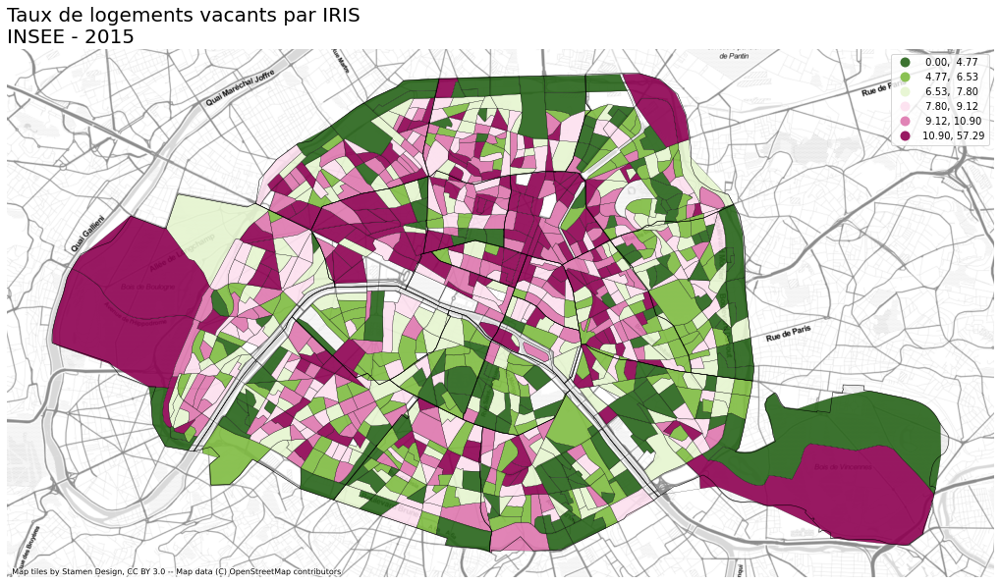

In [59]:
#Faire une carte du taux de logements vacants par IRIS

Carte4, ax = plt.pyplot.subplots(figsize=(18,16))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'black')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.2, color = 'black')
IRISPARIS.to_crs('EPSG:3857').plot(ax=ax, k=6, column='txlogvac', cmap='PiYG_r',scheme='quantiles', alpha=0.9, legend=True)
ctx.add_basemap(ax, source=ctx.providers.Stamen.TonerLite)
ax.axis("off")
plt.pyplot.title('Taux de logements vacants par IRIS\nINSEE - 2015', loc='left', fontsize=20)
plt.pyplot.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  after removing the cwd from sys.path.


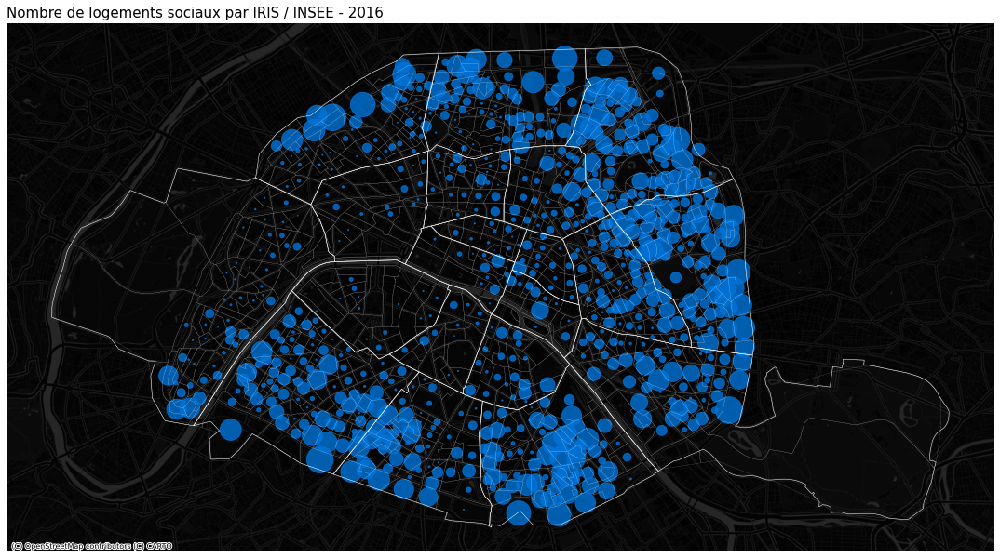

In [63]:
# Faire une carte du nombre de logements sociaux par IRIS

IRIScentro = IRISPARIS.copy()
IRIScentro.geometry = IRIScentro['geometry'].centroid

Carte5, ax = plt.pyplot.subplots(figsize=(19,19))
Ardt.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.5, color = 'white')
IRISPARIS.boundary.to_crs('EPSG:3857').plot(ax=ax, linewidth=0.1, color = 'white')
IRIScentro.to_crs('EPSG:3857').plot(ax=ax, color="#0074D9", markersize=IRIScentro['nb_loc_social']/2, alpha=0.8, categorical=False, legend=True)
ctx.add_basemap(ax, source=ctx.providers.CartoDB.DarkMatterNoLabels)
ax.axis("off")
plt.pyplot.title('Nombre de logements sociaux par IRIS / INSEE - 2016', loc='left', fontsize=15)
plt.pyplot.show()

## Faire la carte du tx de locataire par IRIS
